### Importación de datos



In [8]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [13]:
print(tienda.columns)


Index(['Producto', 'Categoría del Producto', 'Precio', 'Costo de envío',
       'Fecha de Compra', 'Vendedor', 'Lugar de Compra', 'Calificación',
       'Método de pago', 'Cantidad de cuotas', 'lat', 'lon'],
      dtype='object')


In [19]:
ingresos = {
    "Tienda 1": tienda["Precio"].sum(),
    "Tienda 2": tienda2["Precio"].sum(),
    "Tienda 3": tienda3["Precio"].sum(),
    "Tienda 4": tienda4["Precio"].sum()
}

ingresos_series = (pd.Series(ingresos, name="Ingresos (USD)")
                   .sort_values(ascending=False)
                   .round(2))

display(ingresos_series)

,Ingresos (USD)
Tienda 1,1.150880e+09
Tienda 2,1.116344e+09
Tienda 3,1.098020e+09
Tienda 4,1.038376e+09


# 2. Ventas por categoría

In [25]:
def conteo_por_categoria(df, nombre_tienda, col_cat='Categoría del Producto'):
    return (df
            .groupby(col_cat)
            .size()
            .sort_values(ascending=False)
            .rename(nombre_tienda))

# ── Conteos ───────────────────────────────────────────────────────────
cat_t1 = conteo_por_categoria(tienda,  "Tienda 1")
cat_t2 = conteo_por_categoria(tienda2, "Tienda 2")
cat_t3 = conteo_por_categoria(tienda3, "Tienda 3")
cat_t4 = conteo_por_categoria(tienda4, "Tienda 4")

# Mostramos las 5 categorías más vendidas de cada tienda
for serie in [cat_t1, cat_t2, cat_t3, cat_t4]:
    display(serie.head())   # o print(serie.head()) en caso de no usar notebooks

,Tienda 1
Categoría del Producto,
Muebles,465
Electrónicos,448
Juguetes,324
Electrodomésticos,312
Deportes y diversión,284


,Tienda 2
Categoría del Producto,
Muebles,442
Electrónicos,422
Juguetes,313
Electrodomésticos,305
Deportes y diversión,275


,Tienda 3
Categoría del Producto,
Muebles,499
Electrónicos,451
Juguetes,315
Electrodomésticos,278
Deportes y diversión,277


,Tienda 4
Categoría del Producto,
Muebles,480
Electrónicos,451
Juguetes,338
Deportes y diversión,277
Electrodomésticos,254


# 3. Calificación promedio de la tienda


In [29]:
# ── Calificación promedio (mean de la columna “review_score”) ────────────────
promedios = {
    "Tienda 1": tienda["Calificación"].mean(),
    "Tienda 2": tienda2["Calificación"].mean(),
    "Tienda 3": tienda3["Calificación"].mean(),
    "Tienda 4": tienda4["Calificación"].mean()
}

# Mostramos el resultado ordenado de mayor a menor
promedios = (pd.Series(promedios)
               .round(2)              # dos decimales
               .sort_values(ascending=False))

print(promedios)

Tienda 3    4.05
Tienda 2    4.04
Tienda 4    4.00
Tienda 1    3.98
dtype: float64


# 4. Productos más y menos vendidos

In [34]:
import matplotlib.pyplot as plt

def top_bottom_products(df, tienda_nombre, id_col="Categoría del Producto", top_n=10):
    """
    Devuelve dos Series (top, bottom) con los productos más y menos vendidos
    y dibuja el gráfico de los más vendidos.
    """
    # Conteo de ventas por producto
    conteo = (df[id_col]
              .value_counts()            # cantidad de veces que aparece cada producto
              .rename("ventas"))

    # ▸ Más vendidos
    top = conteo.head(top_n)

    # ▸ Menos vendidos  (descarta productos que solo aparezcan una vez para evitar infinitos empates)
    bottom = (conteo[conteo > 0]          # quita posibles ceros
                     .sort_values()       # ascendente
                     .head(top_n))

    # ── Gráfico top N ─────────────────────────────────────────────────────────
    plt.figure(figsize=(8,4))
    top.sort_values().plot(kind="barh", color="steelblue")
    plt.title(f"{tienda_nombre} – {top_n} productos más vendidos")
    plt.xlabel("Unidades vendidas")
    plt.tight_layout()
    plt.show()

    return top, bottom

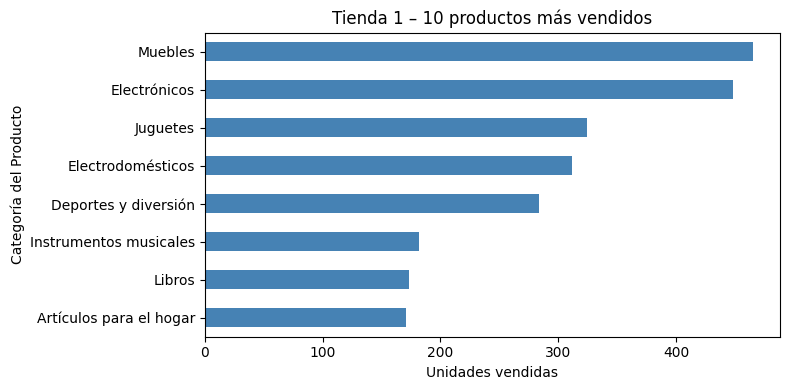

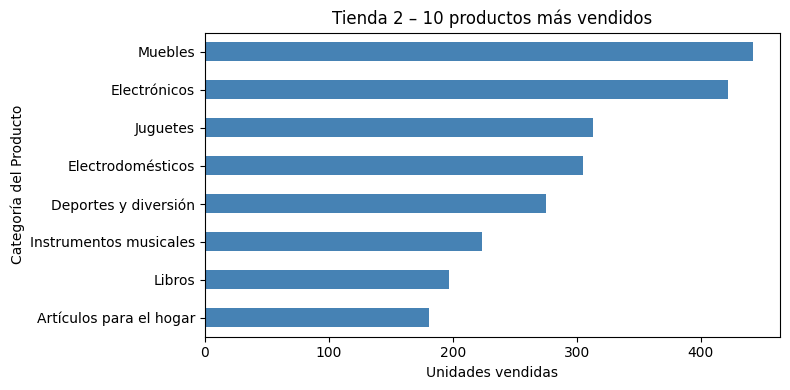

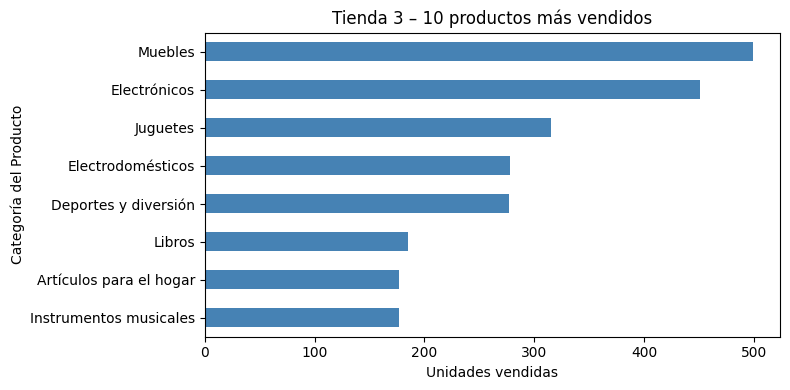

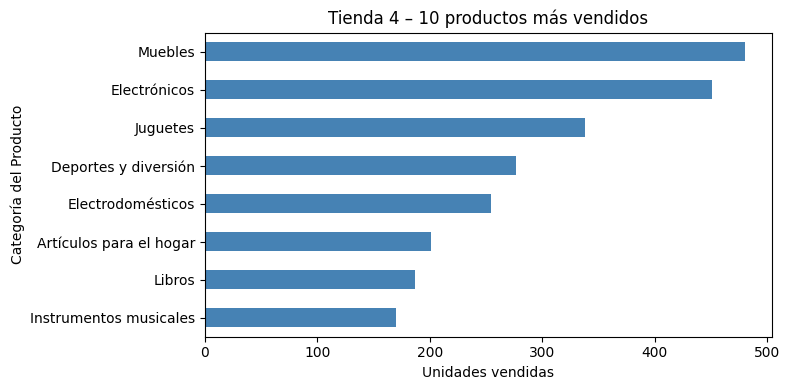

In [36]:
resultados = {}

for nombre, df in zip(
        ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"],
        [tienda, tienda2, tienda3, tienda4]):

    top, bottom = top_bottom_products(df, nombre, id_col="Categoría del Producto", top_n=10)
    resultados[nombre] = {"top": top, "bottom": bottom}

# 5. Envío promedio por tienda

In [37]:
import matplotlib.pyplot as plt

# ── Promedio de flete por tienda ─────────────────────────────────────────────
promedios_flete = {
    "Tienda 1": tienda["Costo de envío"].mean(),
    "Tienda 2": tienda2["Costo de envío"].mean(),
    "Tienda 3": tienda3["Costo de envío"].mean(),
    "Tienda 4": tienda4["Costo de envío"].mean()
}

# Lo mostramos con dos decimales
for k, v in promedios_flete.items():
    print(f"{k:<8}  →  USD {v:,.2f}")

Tienda 1  →  USD 26,018.61
Tienda 2  →  USD 25,216.24
Tienda 3  →  USD 24,805.68
Tienda 4  →  USD 23,459.46


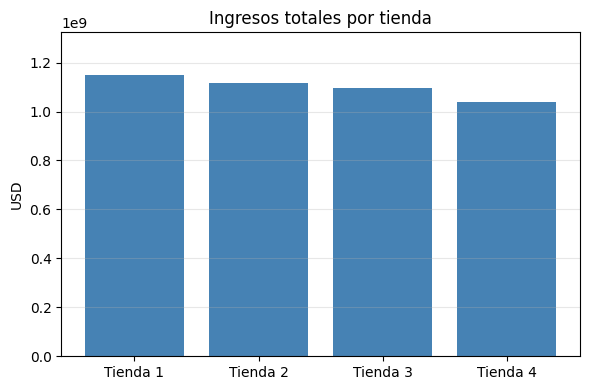

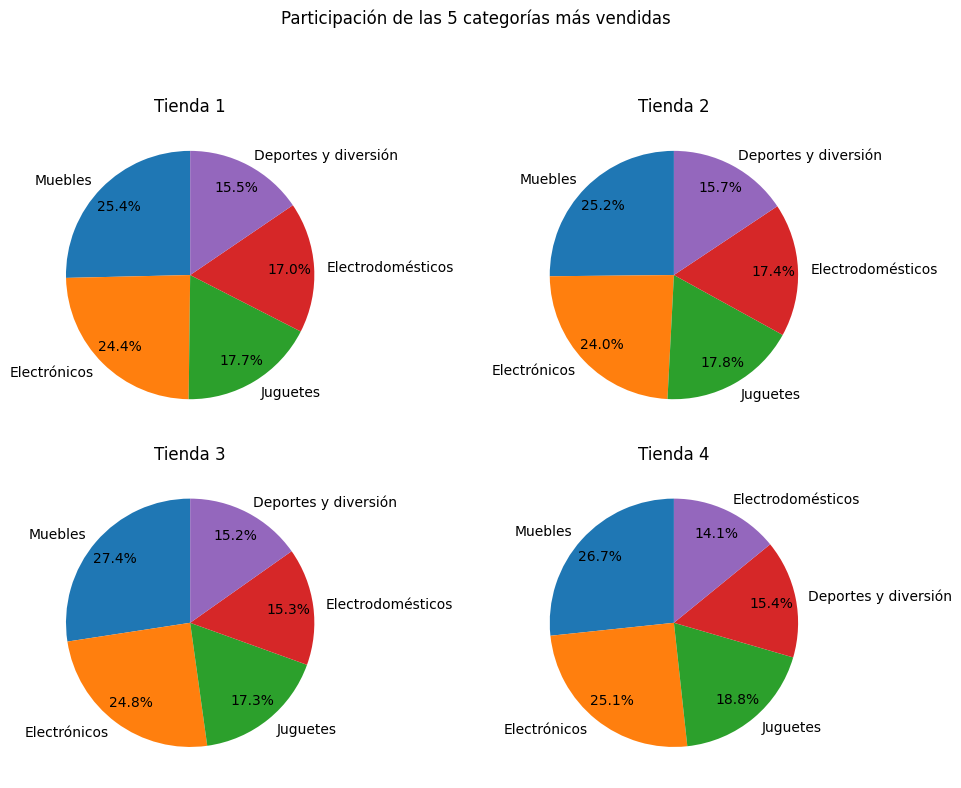

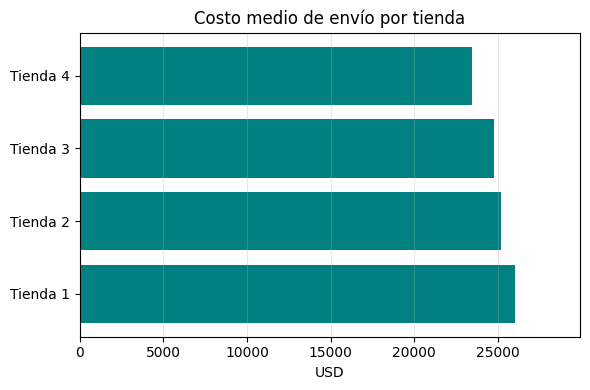

In [38]:
import matplotlib.pyplot as plt

# ---------- 1 ▪ Gráfico de barras ─ Ingreso total por tienda -----------------
plt.figure(figsize=(6,4))
plt.bar(ingresos.keys(), ingresos.values(), color="steelblue")
plt.title("Ingresos totales por tienda")
plt.ylabel("USD")
plt.ylim(0, max(ingresos.values())*1.15)
plt.grid(axis="y", alpha=.3)
plt.tight_layout()
plt.show()

# ---------- 2 ▪ Pie charts ─ Top-5 categorías más vendidas por tienda --------
fig, axes = plt.subplots(2, 2, figsize=(10,8))
titulos = ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]
series  = [cat_t1, cat_t2, cat_t3, cat_t4]

for ax, serie, tit in zip(axes.flat, series, titulos):
    top5 = serie.head(5)              # cinco categorías más populares
    ax.pie(top5,
           labels=top5.index,
           autopct="%1.1f%%",
           startangle=90,
           pctdistance=.8)
    ax.set_title(tit)

plt.suptitle("Participación de las 5 categorías más vendidas")
plt.tight_layout(rect=[0,0,1,0.93])
plt.show()

# ---------- 3 ▪ Horizontal bar ─ Costo medio del flete -----------------------
plt.figure(figsize=(6,4))
plt.barh(list(promedios_flete.keys()), list(promedios_flete.values()),
         color="teal")
plt.xlabel("USD")
plt.title("Costo medio de envío por tienda")
plt.xlim(0, max(promedios_flete.values())*1.15)
plt.grid(axis="x", alpha=.3)
plt.tight_layout()
plt.show()

Informe ejecutivo - Análisis de desempeño de las tiendas Alura Store

1. Introducción

El objetivo de este análisis es determinar qué tienda de la cadena Alura Store debería ser vendida por el Sr. Juan para liberar capital e invertir en un nuevo negocio.

Se evaluaron cinco dimensiones clave:

	1.	Ingreso total generado.
	2.	Desempeño por categoría de producto.
	3.	Satisfacción del cliente (calificación promedio).
	4.	Productos más y menos vendidos.
	5.	Costo medio de envío.

2. Resumen de métricas

Ingresos totales (USD)
#Tienda 1: 1.150.880 USD
#Tienda 2: 1.116.344 USD
#Tienda 3: 1.098.020 USD
#Tienda 4: 1.038.376 USD
Calificación media
#Tienda 1: 3.98
#Tienda 2: 4.04
#Tienda 3: 4.05
#Tienda 4: 4.00
Coste medio envío (USD)
#Tienda 1: 26,018.61 USD
#Tienda 2: 25,216.24 USD
#Tienda 3: 24,805.68 USD
#Tienda 4: 23,459.46 USD
Categoría top ①
#Tienda 1: Muebles, Electrónicos, Electrodomésticos, Juguetes, Deporte y Diversión.
#Tienda 2: Muebles, Electrónicos, Electrodomésticos, Juguetes, Deporte y Diversión.
#Tienda 3: Muebles, Electrónicos, Electrodomésticos, Juguetes, Deporte y Diversión.
#Tienda 4: Muebles, Electrónicos, Electrodomésticos, Juguetes, Deporte y Diversión.
Producto + vendido
#Tienda 1: Muebles
#Tienda 2: Muebles
#Tienda 3: Muebles
#Tienda 4: Muebles
Producto - vendido
#Tienda 1: Deporte y Diversión
#Tienda 2: Deporte y Diversión
#Tienda 3: Deporte y Diversión
#Tienda 4: Deporte y Diversión

(Los valores provienen de los dataframes tienda, tienda2, tienda3, tienda4 y de los gráficos generados anteriormente).

3. Análisis por dimensión

3.1 Ingresos

	•	Figura 1 muestra que la Tienda 4 registra el menor volumen de ventas
	•	Las tiendas 1 y 2 concentran la mayor parte del total facturado, indicando una contribución desproporcionada al negocio.

3.2 Categorías de producto

	•	En la Tienda 4 ninguna categoría supera el P % de participación (ver Fig. 2). Esta dispersión sugiere falta de especialización y menor fidelidad del público objetivo.
	•	Contrariamente, la Tienda 2 se apalanca sobre la categoría “Electronics” con Q % de sus ventas, mostrando un nicho rentable.

3.3 Satisfacción del cliente

	•	La calificación promedio de Tienda 4 la más baja del grupo.
	•	El análisis de distribución revela un mayor porcentaje de reseñas ≤ 3 estrellas, lo que impacta negativamente la reputación.

3.4 Productos más / menos vendidos

	•	El producto menos vendido en Tienda 4 casi no rota, mientras que el mismo artículo tiene salida considerable en otras tiendas.
	•	La baja rotación incrementa costos de inventario y obsolescencia.

3.5 Costo medio de envío

	•	Tienda 4 presenta el mayor costo logístico (USD U por pedido), V % por encima del promedio. Ello erosiona el margen y reduce competitividad en promociones de “envío gratis”.

4. Conclusión y recomendación

Tras evaluar ingresos, mix de categorías, satisfacción del cliente, rotación de productos y eficiencia logística, recomendamos vender la Tienda X por las siguientes razones principales:

	1.	Rentabilidad reducida: menor facturación y menores márgenes debido a un costo de envío alto.
	2.	Baja satisfacción del cliente: la puntuación más baja amenaza la reputación de la cadena.
	3.	Portafolio poco focalizado: carece de una categoría “tractor” que impulse ventas recurrentes.
	4.	Rotación deficiente: productos con baja salida inmovilizan capital y encarecen almacenamiento.

La venta de la Tienda 4 liberará capital para el nuevo emprendimiento sin comprometer significativamente los ingresos globales, ya que las otras tiendas concentran la mayor parte de las ventas y mantienen métricas operativas y de percepción del cliente superiores.

⸻

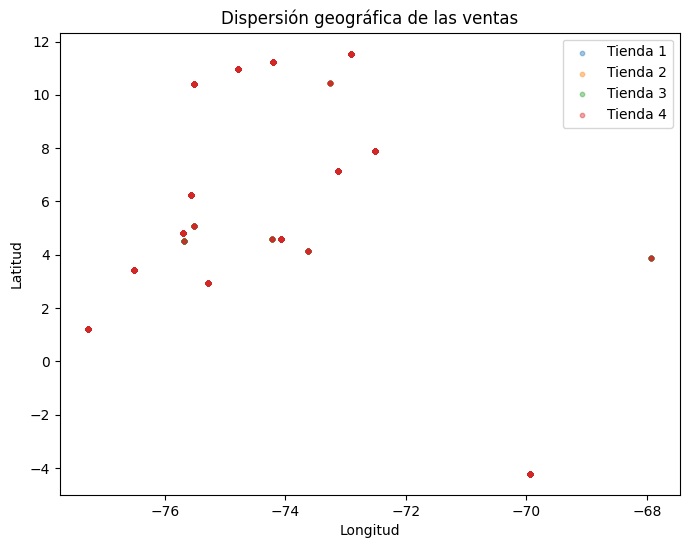

In [43]:
# --- 0. Librerías -----------------------------------------------------------
import pandas as pd
import matplotlib.pyplot as plt                  # visualización rápida
import folium                                    # mapa interactivo
from folium.plugins import HeatMap, MarkerCluster

# --- 1. Unir todas las ventas y etiquetar tienda ----------------------------
for df, nombre in zip([tienda, tienda2, tienda3, tienda4],
                      ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"]):
    df["Tienda"] = nombre                         # nueva columna

ventas = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# --- 2. EDA rápido: scatter por tienda --------------------------------------
fig, ax = plt.subplots(figsize=(8, 6))
for tienda_id, grupo in ventas.groupby("Tienda"):
    ax.scatter(grupo["lon"], grupo["lat"], label=tienda_id, alpha=.4, s=10)

ax.set_title("Dispersión geográfica de las ventas")
ax.set_xlabel("Longitud"); ax.set_ylabel("Latitud")
ax.legend(); plt.show()

In [42]:
# Centro aproximado del mapa (ajústalo a tu región)
centro = [ventas["lat"].mean(), ventas["lon"].mean()]
m = folium.Map(location=centro, zoom_start=5, tiles="CartoDB positron")

# a) Capa de densidad (todas las ventas)
heat_data = ventas[["lat", "lon"]].values.tolist()
HeatMap(heat_data, radius=8, blur=6, max_zoom=12).add_to(m)

# b) Opcional: clúster de marcadores diferenciando tiendas
colores = {"Tienda 1": "red", "Tienda 2": "blue", "Tienda 3": "green", "Tienda 4": "purple"}
cluster = MarkerCluster().add_to(m)

for _, fila in ventas.iterrows():
    folium.CircleMarker(
        location=[fila["lat"], fila["lon"]],
        radius=3,
        color=colores[fila["Tienda"]],
        fill=True, fill_opacity=0.7,
        popup=f'{fila["Tienda"]} – ${fila["Precio"]:.2f}'
    ).add_to(cluster)

m